In [14]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import seaborn as sns
import plotly.express as px 
from plotly_calplot import calplot


pd.set_option("display.max_columns", 200)

# Set a light color palette
sns.set_palette("pastel")

## Load the dataset

In [15]:
# Load the dataset 
path_to_csv = "./flights.csv"
path_to_cancellation_codes = "./cancellation_codes.csv"
df = pd.read_csv(path_to_csv, low_memory=False)
cancellation_codes = pd.read_csv(path_to_cancellation_codes)

df.head()

,year,quarter,month,dayofmonth,dayofweek,flightdate,reporting_airline,dot_id_reporting_airline,iata_code_reporting_airline,tail_number,flight_number_reporting_airline,originairportid,originairportseqid,origincitymarketid,origin,origincityname,originstate,originstatefips,originstatename,originwac,destairportid,destairportseqid,destcitymarketid,dest,destcityname,deststate,deststatefips,deststatename,destwac,crsdeptime,deptime,depdelay,depdelayminutes,depdel15,departuredelaygroups,deptimeblk,taxiout,wheelsoff,wheelson,taxiin,crsarrtime,arrtime,arrdelay,arrdelayminutes,arrdel15,arrivaldelaygroups,arrtimeblk,cancelled,cancellationcode,diverted,crselapsedtime,actualelapsedtime,airtime,flights,distance,distancegroup,carrierdelay,weatherdelay,nasdelay,securitydelay,lateaircraftdelay,firstdeptime,totaladdgtime,longestaddgtime,divairportlandings,divreacheddest,divactualelapsedtime,divarrdelay,divdistance,div1airport,div1airportid,div1airportseqid,div1wheelson,div1totalgtime,div1longestgtime,div1wheelsoff,div1tailnum,div2airport,div2airportid,div2airportseqid,div2wheelson,div2totalgtime,div2longestgtime,div2wheelsoff,div2tailnum,div3airport,div3airportid,div3airportseqid,div3wheelson,div3totalgtime,div3longestgtime,div3wheelsoff,div3tailnum,div4airport,div4airportid,div4airportseqid,div4wheelson,div4totalgtime,div4longestgtime,div4wheelsoff,div4tailnum,div5airport,div5airportid,div5airportseqid,div5wheelson,div5totalgtime,div5longestgtime,div5wheelsoff,div5tailnum,empty_col
0,2021,4,12,8,3,2021-12-08,OH,20397,OH,N522AE,5349,11617,1161708,31617,EWN,"New Bern/Morehead/Beaufort, NC",NC,37,North Carolina,36,11057,1105703,31057,CLT,"Charlotte, NC",NC,37,North Carolina,36,1814,1811.0,-3.0,0.0,0.0,-1.0,1800-1859,12.0,1823.0,1917.0,14.0,1939,1931.0,-8.0,0.0,0.0,-1.0,1900-1959,0.0,NaN,0.0,85.0,80.0,54.0,1.0,221.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021,4,12,9,4,2021-12-09,OH,20397,OH,N529EA,5349,11617,1161708,31617,EWN,"New Bern/Morehead/Beaufort, NC",NC,37,North Carolina,36,11057,1105703,31057,CLT,"Charlotte, NC",NC,37,North Carolina,36,1814,1803.0,-11.0,0.0,0.0,-1.0,1800-1859,21.0,1824.0,1928.0,6.0,1939,1934.0,-5.0,0.0,0.0,-1.0,1900-1959,0.0,NaN,0.0,85.0,91.0,64.0,1.0,221.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021,4,12,10,5,2021-12-10,OH,20397,OH,N500AE,5349,11617,1161708,31617,EWN,"New Bern/Morehead/Beaufort, NC",NC,37,North Carolina,36,11057,1105703,31057,CLT,"Charlotte, NC",NC,37,North Carolina,36,1814,1812.0,-2.0,0.0,0.0,-1.0,1800-1859,27.0,1839.0,1933.0,6.0,1939,1939.0,0.0,0.0,0.0,0.0,1900-1959,0.0,NaN,0.0,85.0,87.0,54.0,1.0,221.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021,4,12,11,6,2021-12-11,OH,20397,OH,N531EG,5349,11617,1161708,31617,EWN,"New Bern/Morehead/Beaufort, NC",NC,37,North Carolina,36,11057,1105703,31057,CLT,"Charlotte, NC",NC,37,North Carolina,36,1814,1846.0,32.0,32.0,1.0,2.0,1800-1859,16.0,1902.0,1957.0,7.0,1939,2004.0,25.0,25.0,1.0,1.0,1900-1959,0.0,NaN,0.0,85.0,78.0,55.0,1.0,221.0,1,0.0,0.0,0.0,0.0,25.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021,4,12,12,7,2021-12-12,OH,20397,OH,N500AE,5349,11617,1161708,31617,EWN,"New Bern/Morehead/Beaufort, NC",NC,37,North Carolina,36,11057,1105703,31057,CLT,"Charlotte, NC",NC,37,North Carolina,36,1814,1808.0,-6.0,0.0,0.0,-1.0,1800-1859,15.0,1823.0,1912.0,7.0,1939,1919.0,-20.0,0.0,0.0,-2.0,1900-1959,

In [16]:
# Get information about the shape of the dataframe 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1099444 entries, 0 to 1099443
Columns: 110 entries, year to empty_col
dtypes: float64(70), int64(21), object(19)
memory usage: 922.7+ MB


In [17]:
# Check some values 
print("Years available: {}".format(df["year"].unique())) 
print("Quarters available: {}".format(df["quarter"].unique()))
print("Months available: {}".format(df["month"].unique()))
print("Airlines available: {}".format(df["reporting_airline"].unique()))
print("Origins available: {}".format(len(df["origin"].unique())))
print("Origin City names available: {}".format(len(df["origincityname"].unique())))
print("Destinations available: {}".format(len(df["dest"].unique())))
print("Destination city names available: {}".format(len(df["destcityname"].unique())))


Years available: [2021]
Quarters available: [4]
Months available: [12 11]
Airlines available: ['OH' 'OO' 'UA' 'QX' 'DL' 'F9' 'G4' 'NK' 'HA' 'MQ' 'WN' 'YV' 'YX' '9E'
 'AA' 'AS' 'B6']
Origins available: 363
Origin City names available: 357
Destinations available: 363
Destination city names available: 357


## Scheduled Flights per Airline Analysis

##### Which is the airline with the largest number of scheduled flights? 

In [18]:
# Found online the relation between iata code and airline name 
airlines = pd.read_csv("https://raw.githubusercontent.com/beanumber/airlines/master/data-raw/airlines.csv")

# Check the number of flights done for each airline 
airline_counts = df["reporting_airline"].value_counts()

# Renaming the index to the airline name 
airline_counts.index = airline_counts.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Histogram plot 
px.bar(airline_counts.sort_values(ascending=True).to_frame("Count"), orientation="h", template="seaborn", x="Count", height=500, title="Scheduled Flights")

#### Are the airlines with the highest number of scheduled flights also the ones covering an higher number of airports? 

In [19]:
# Let's check if the airlines with the highest number of scheduled flights are the ones covering an higher number of airports 

# Grouping by airline and counting unique airports
airline_airport_counts = df.groupby("reporting_airline")["origin"].nunique()

# Renaming the index to the airline name
airline_airport_counts.index = airline_airport_counts.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Bar plot for the number of airports covered by each airline
px.bar(airline_airport_counts.sort_values(ascending=True).to_frame("Count"), orientation="h", template="seaborn", x="Count", height=500, title="Airports Covered by Each Airline")

#### Check for the number of covered states by each airline

In [20]:
# Grouping by airline and counting unique states
airline_state_counts = df.groupby("reporting_airline")["originstate"].nunique()

# Renaming the index to the airline name
airline_state_counts.index = airline_state_counts.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Bar plot for the number of airports covered by each airline
px.bar(airline_state_counts.sort_values(ascending=True).to_frame("Count"), orientation="h", template="seaborn", x="Count", height=500, title="States Covered by Each Airline")

##### Is there a period with way more flights? 

From the following plots, we can observe two days with a drop in the number of scheluded flights: 25th November 2021 (Thanksgiving day) and 25th December 2021 (Christmas).

In [21]:
# Filter data for November
df_nov = df[df["month"] == 11]

# Create histogram with Plotly Express
fig = px.histogram(df_nov, x="dayofmonth", nbins=len(df_nov["dayofmonth"].unique()),
                   labels={'dayofmonth': 'Day of Month', 'count': 'Number of Flights'},
                   title='Number of Flights per Day in November',
                   color_discrete_sequence=['skyblue'])

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Day of Month'),
    yaxis=dict(title='Number of Flights'),
    showlegend=False  # remove legend
)

# Show the plot
fig.show()

In [22]:
# Filter data for December
df_dec = df[df["month"] == 12]

# Create histogram with Plotly Express
fig = px.histogram(df_dec, x="dayofmonth", nbins=len(df_dec["dayofmonth"].unique()),
                   labels={'dayofmonth': 'Day of Month', 'count': 'Number of Flights'},
                   title='Number of Flights per Day in December',
                   color_discrete_sequence=['skyblue'])

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Day of Month'),
    yaxis=dict(title='Number of Flights'),
    showlegend=False  # remove legend
)

# Show the plot
fig.show()

## Delay and Cancellation Analysis 

Main columns for the analysis:

- Time components: 
    - year (only 2021)
    - quarter (only 4)
    - month (only 11 and 12)
    - dayofmonth
    - dayofweek
    - flighdate
- Flight Info:
    - Airline: reporting_airline 
    - Origin: origin, origincityname
    - Destination: dest, destcityname
- Departure:
    - Departure time (Scheduled and Actual): crsdeptime, deptime
    - Delay: depdelay, depdelayminutes
- Cancelled: 
    - cancelled
    - cancellationcode

### Cancellation Analysis

##### Which is the airline with the highest percentage of cancelled flights? 

In [23]:
df["cancelled"] = df["cancelled"].astype("bool")
print("In 2021, {:.2f}% of flights have been cancelled.".format(df["cancelled"].mean()*100 ))

# Check which airline had the highest percentage of flights cancelled 
cancelled = df.groupby("reporting_airline").agg(
    Cancelled=pd.NamedAgg(column="cancelled", aggfunc="sum"),
    Not_Cancelled=pd.NamedAgg(column="cancelled", aggfunc="count"),
    Percentage=pd.NamedAgg(column="cancelled", aggfunc="mean")
)
cancelled["Not_Cancelled"] = cancelled["Not_Cancelled"] - cancelled["Cancelled"]
cancelled["Percentage"] *= 100
cancelled.index = cancelled.index.map(airlines.set_index("Code")["Description"]).rename("Airline")


# Histogram for percentage of cancelled flights 

# Sort the DataFrame by Percentage in ascending order
cancelled_sorted = cancelled.sort_values(by="Percentage")

# Create a horizontal bar plot using plotly
fig = px.bar(
    cancelled_sorted,
    x="Percentage",
    y=cancelled_sorted.index,
    orientation='h',
    labels={'Percentage': 'Cancellation Rate', 'index': 'Airlines'},
    title="Cancelled Flights in 2021",
    width=800,
    height=500
)

# Add percentage labels on the bars
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Adjust layout to prevent labels going outside the image
fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),  # Adjust top margin to make room for title
    xaxis=dict(range=[0, 5]),  # Set x-axis range to ensure all bars are visible
)

# Show the plot
fig.show()



In 2021, 1.52% of flights have been cancelled.


##### How are the cancelled flights distributed over November and December?

In [24]:
# Analysis of cancellations each day 

# Convert flightdate to datetime format
df["flightdate"] = pd.to_datetime(df["flightdate"])

# Take cancelled flights 
events = df.groupby("flightdate")["cancelled"].mean()
fig = calplot(events.apply(np.log).reset_index(), x="flightdate", y="cancelled")
fig.show()

##### In which day of the week flights are usually cancelled? 

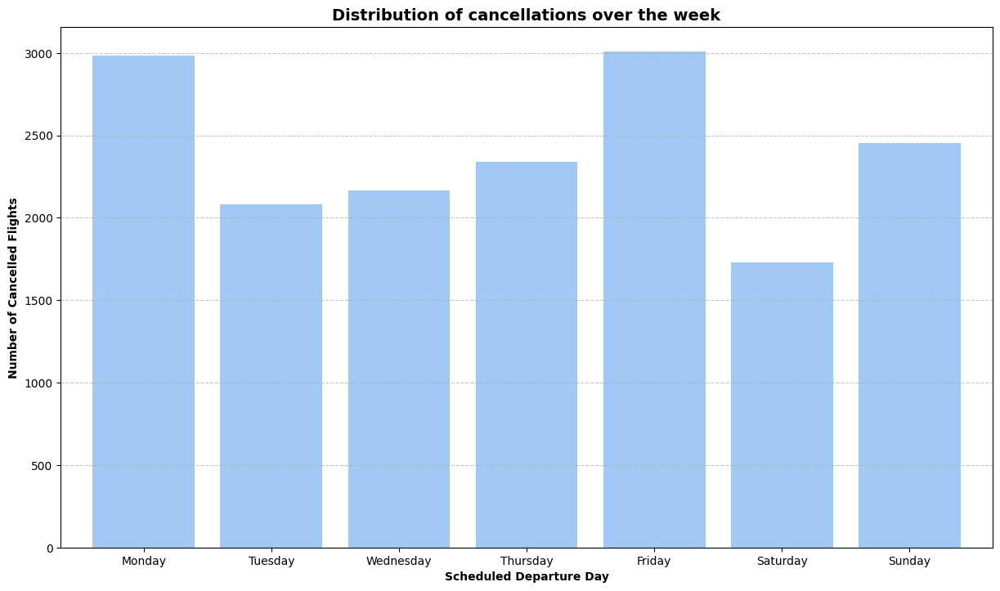

In [25]:
# Distribution over the days 

# Filter out rows with cancelled flights
cancelled_flights = df[df['cancelled'] == 1]

# Plot
ax = cancelled_flights.groupby('dayofweek')['cancelled'].sum().plot.bar(figsize=[14.70, 8.27], width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Title, labels & legend
plt.title("Distribution of cancellations over the week", fontsize=14, weight="bold")
plt.ylabel('Number of Cancelled Flights', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Day', fontsize=10, weight="bold")

# Customize x-axis ticks
day_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.xticks(range(7), day_labels, rotation=0)

plt.show()

#### Distribution of cancelled flights over November and December

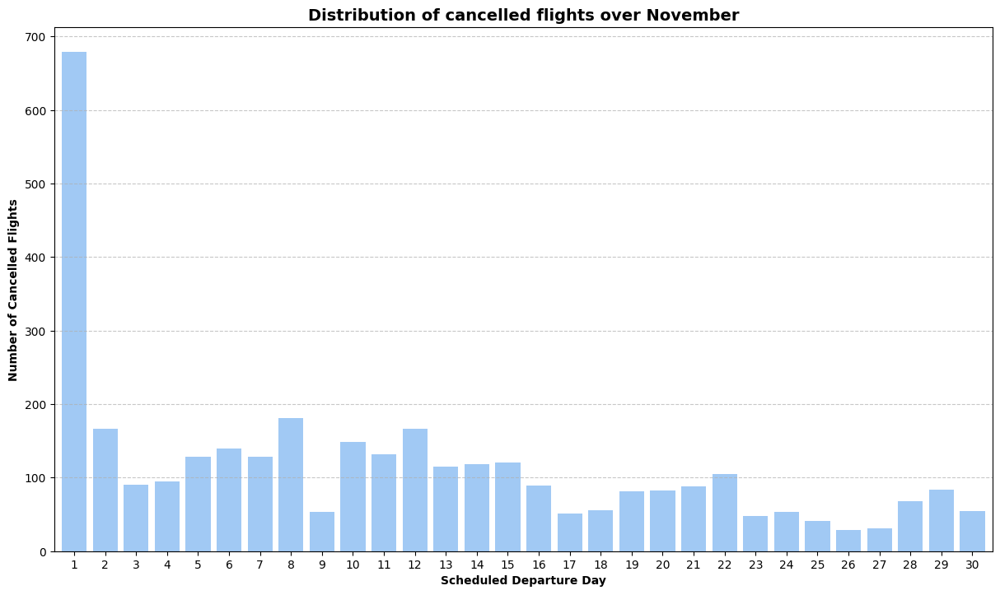

In [26]:
# Distribution over the day of month 

# Filter November 
cancelled_flights_nov = cancelled_flights[cancelled_flights["month"] == 11]

# Plot 
ax = cancelled_flights_nov.groupby('dayofmonth')['cancelled'].sum().plot.bar(figsize=[14.70, 8.27], width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Title, labels & legend
plt.title("Distribution of cancelled flights over November", fontsize=14, weight="bold")
plt.ylabel('Number of Cancelled Flights', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Day', fontsize=10, weight="bold")

# Rotate x-axis labels horizontally
plt.xticks(rotation=0)

plt.show()

##### Why 1st of November has so many cancelled flights? 

In [27]:
# Let's analyze the reason of cancelled flights in the 1st of November 

# Create a dictionary to map cancellation codes to descriptions
code_to_description = dict(zip(cancellation_codes['Code'], cancellation_codes['Description']))

# Filter data for the 1st of November
cancelled_flights_nov_1 = cancelled_flights_nov[cancelled_flights_nov["dayofmonth"] == 1]
cancelled_flights_nov_1["CancellationDescription"] = cancelled_flights_nov_1["cancellationcode"].map(code_to_description)

# Count the occurrences of each cancellation description
cancelled_flights_nov_1_count = cancelled_flights_nov_1['CancellationDescription'].value_counts()


# Plot pie chart
fig = px.pie(
    cancelled_flights_nov_1_count,
    names=cancelled_flights_nov_1_count.index,
    values='CancellationDescription',
    title='Distribution of Cancellation Reasons in the 1st of November',
    labels={'CancellationDescription': 'Number of Cancellations', 'index': 'Cancellation Reason'},
    color_discrete_sequence=px.colors.qualitative.Set3,  # You can choose a different color sequence if needed
    height=600
)

# Adjust legend size in layout
fig.update_layout(
    legend=dict(
        title='',
        title_font=dict(size=35),  # Adjust the font size as needed
        font=dict(size=25),  # Adjust the font size as needed
        x=0.83,  # Adjust the x position (0 to 1)
        y=0.9,  # Adjust the y position (0 to 1)
    )
)

# Show the plot
fig.show()

/tmp/ipykernel_285/3387193858.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [28]:
# Which airline has the most cancelled flights in the 1st of November ? 

cancelled_flights_nov_1_airlines = cancelled_flights_nov_1["reporting_airline"].value_counts()

# Renaming the index to the airline name 
cancelled_flights_nov_1_airlines.index = cancelled_flights_nov_1_airlines.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Histogram plot 
px.bar(cancelled_flights_nov_1_airlines.sort_values(ascending=True).to_frame("Count"), orientation="h", template="seaborn", x="Count", height=500, title="Cancelled Flights the 1st of November")

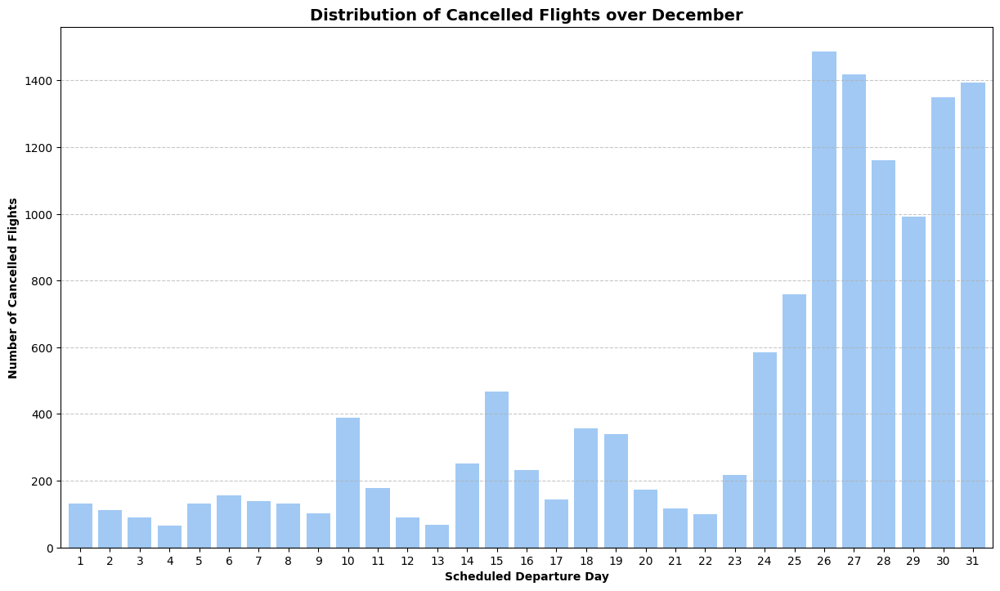

In [29]:
# Distribution over the day of month 

# Filter December
cancelled_flights_dec = cancelled_flights[cancelled_flights["month"] == 12]

# Plot
ax = cancelled_flights_dec.groupby('dayofmonth')['cancelled'].sum().plot.bar(figsize=[14.70, 8.27], width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Title, labels & legend
plt.title("Distribution of Cancelled Flights over December", fontsize=14, weight="bold")
plt.ylabel('Number of Cancelled Flights', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Day', fontsize=10, weight="bold")

# Rotate x-axis labels horizontally
plt.xticks(rotation=0)

plt.show()

##### Why so many cancelled flights in the last week of December? 

In [30]:
# Let's analyze the reason of cancelled flights in the last days of December 

# Filter data for the last days of December
cancelled_flights_dec_last= cancelled_flights_dec[cancelled_flights_dec["dayofmonth"] >= 24]
cancelled_flights_dec_last["CancellationDescription"] = cancelled_flights_dec_last["cancellationcode"].map(code_to_description)

# Count the occurrences of each cancellation description
cancelled_flights_dec_last_count = cancelled_flights_dec_last['CancellationDescription'].value_counts()


# Plot pie chart
fig = px.pie(
    cancelled_flights_dec_last_count,
    names=cancelled_flights_dec_last_count.index,
    values='CancellationDescription',
    title='Distribution of Cancellation Reasons from 24th to 31st of December',
    labels={'CancellationDescription': 'Number of Cancellations', 'index': 'Cancellation Reason'},
    color_discrete_sequence=px.colors.qualitative.Set3,  # You can choose a different color sequence if needed
    height=600
)

# Adjust legend size in layout
fig.update_layout(
    legend=dict(
        title='',
        title_font=dict(size=35),  # Adjust the font size as needed
        font=dict(size=25),  # Adjust the font size as needed
        x=0.83,  # Adjust the x position (0 to 1)
        y=0.9,  # Adjust the y position (0 to 1)
    )
)

# Show the plot
fig.show()

/tmp/ipykernel_285/2218897275.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
# Which airline has the most cancelled flights in the last week of December ? 

cancelled_flights_dec_last_airlines = cancelled_flights_dec_last["reporting_airline"].value_counts()

# Renaming the index to the airline name 
cancelled_flights_dec_last_airlines.index = cancelled_flights_dec_last_airlines.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Histogram plot 
px.bar(cancelled_flights_dec_last_airlines.sort_values(ascending=True).to_frame("Count"), orientation="h", template="seaborn", x="Count", height=500, title="Cancelled Flights per Airline from 24th to 31st of  December")

##### Check percentage of cancelled flights with respect to total scheduled flights by each airline

In [32]:
# Filter to the last week of December 
schedule_dec_last = df[(df["dayofmonth"] > 24) & (df["month"] == 12)]
schedule_dec_last

# Check which airline had the highest percentage of flights cancelled 
cancelled_dec_last = schedule_dec_last.groupby("reporting_airline").agg(
    Cancelled=pd.NamedAgg(column="cancelled", aggfunc="sum"),
    Not_Cancelled=pd.NamedAgg(column="cancelled", aggfunc="count"),
    Percentage=pd.NamedAgg(column="cancelled", aggfunc="mean")
)
cancelled_dec_last["Not_Cancelled"] = cancelled_dec_last["Not_Cancelled"] - cancelled_dec_last["Cancelled"]
cancelled_dec_last["Percentage"] *= 100
cancelled_dec_last.index = cancelled_dec_last.index.map(airlines.set_index("Code")["Description"]).rename("Airline")


# Histogram for percentage of cancelled flights 

# Sort the DataFrame by Percentage in ascending order
cancelled_sorted = cancelled_dec_last.sort_values(by="Percentage")

# Create a horizontal bar plot using plotly
fig = px.bar(
    cancelled_sorted,
    x="Percentage",
    y=cancelled_sorted.index,
    orientation='h',
    labels={'Percentage': 'Cancellation Rate', 'index': 'Airlines'},
    title="Cancelled Flights Last Week December ",
    width=800,
    height=500
)

# Add percentage labels on the bars
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Adjust layout to prevent labels going outside the image
fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),  # Adjust top margin to make room for title
    xaxis=dict(range=[0, 30]),  # Set x-axis range to ensure all bars are visible
)

# Show the plot
fig.show()




In [33]:
# Filter to the 1st of November 
schedule_dec_last = df[(df["dayofmonth"] == 1) & (df["month"] == 11)]
schedule_dec_last

# Check which airline had the highest percentage of flights cancelled 
cancelled_dec_last = schedule_dec_last.groupby("reporting_airline").agg(
    Cancelled=pd.NamedAgg(column="cancelled", aggfunc="sum"),
    Not_Cancelled=pd.NamedAgg(column="cancelled", aggfunc="count"),
    Percentage=pd.NamedAgg(column="cancelled", aggfunc="mean")
)
cancelled_dec_last["Not_Cancelled"] = cancelled_dec_last["Not_Cancelled"] - cancelled_dec_last["Cancelled"]
cancelled_dec_last["Percentage"] *= 100
cancelled_dec_last.index = cancelled_dec_last.index.map(airlines.set_index("Code")["Description"]).rename("Airline")


# Histogram for percentage of cancelled flights 

# Sort the DataFrame by Percentage in ascending order
cancelled_sorted = cancelled_dec_last.sort_values(by="Percentage")

# Create a horizontal bar plot using plotly
fig = px.bar(
    cancelled_sorted,
    x="Percentage",
    y=cancelled_sorted.index,
    orientation='h',
    labels={'Percentage': 'Cancellation Rate', 'index': 'Airlines'},
    title="Cancelled Flights 1st of November",
    width=800,
    height=500
)

# Add percentage labels on the bars
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Adjust layout to prevent labels going outside the image
fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),  # Adjust top margin to make room for title
    xaxis=dict(range=[0, 30]),  # Set x-axis range to ensure all bars are visible
)

# Show the plot
fig.show()

#### General analysis over the two months

##### Which is the main reason for cancelled flights? 

In [34]:
# Map cancellation codes to descriptions using the dictionary
cancelled_flights['CancellationDescription'] = cancelled_flights['cancellationcode'].map(code_to_description)

# Count the occurrences of each cancellation description
cancellation_counts = cancelled_flights['CancellationDescription'].value_counts()

# Create a vertical bar plot using Plotly Express
fig = px.bar(
    cancellation_counts,
    x=cancellation_counts.index,
    y='CancellationDescription',
    title='Distribution of Cancellation Reasons',
    labels={'CancellationDescription': 'Number of Cancellations', 'index': 'Cancellation Reason'},
    color_continuous_scale='Blues',
    height=600
)

# Add labels on top of each bar
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Customize layout
fig.update_layout(
    xaxis_title='Cancellation Reason',
    yaxis_title='Number of Cancellations',
    xaxis_tickangle=0,  # Rotate x-axis labels horizontally
)
# Show the plot
fig.show()


/tmp/ipykernel_285/2723764714.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
# Sampe information, but pie chart 


fig = px.pie(
    cancellation_counts,
    names=cancellation_counts.index,
    values='CancellationDescription',
    title='Distribution of Cancellation Reasons',
    labels={'CancellationDescription': 'Number of Cancellations', 'index': 'Cancellation Reason'},
    color_discrete_sequence=px.colors.qualitative.Set3,  # You can choose a different color sequence if needed
    height=600
)

# Adjust legend size in layout
fig.update_layout(
    legend=dict(
        title='',
        title_font=dict(size=35),  # Adjust the font size as needed
        font=dict(size=25),  # Adjust the font size as needed
        x=0.83,  # Adjust the x position (0 to 1)
        y=0.9,  # Adjust the y position (0 to 1)
    )
)

# Show the plot
fig.show()


##### Which is the airline with the highest percentage of cancelled flights due to carrier reason?

In [36]:
# Filter out rows with cancelled flights and 'Carrier' cancellation reason
carrier_cancelled_flights = cancelled_flights[cancelled_flights["CancellationDescription"] == "Carrier"]

# Count the occurrences of cancelled flights for each airline
carrier_cancellation_counts = carrier_cancelled_flights['reporting_airline'].value_counts()
carrier_cancellation_counts.index = carrier_cancellation_counts.index.map(airlines.set_index("Code")["Description"]).rename("Airline")

# Get the percentage of cancelled flights in the all scheduled flights 
carrier_cancellation_percentage= carrier_cancellation_counts/airline_counts * 100
carrier_cancellation_percentage = carrier_cancellation_percentage.sort_values(ascending=True)


# Create a horizontal bar plot using Plotly Express
fig = px.bar(
    carrier_cancellation_percentage.to_frame("Cancellation Rate"),
    x="Cancellation Rate",
    y=carrier_cancellation_percentage.index,
    title='Cancelled Flights Due to Carrier Issues',
    color_continuous_scale='Blues',
    orientation='h',
    width=800,
    height=500
)

# Add percentage labels on the bars
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Adjust layout to prevent labels going outside the image
fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),  # Adjust top margin to make room for title
    xaxis=dict(range=[0, 5]),  # Set x-axis range to ensure all bars are visible
)

# Show the plot
fig.show()


### Delay Analysis

Define three categories of delay:
- On time or small delay (up to 15 minutes delay) --> Good flight
- Medium delay (15 – 45 minutes delay) --> Bad flight
- Large delay (45 minutes delay or higher) --> Bad flight

In [37]:
# Create a dictionary to map airline codes to airline names
code_to_airline = dict(zip(airlines['Code'], airlines['Description']))

# Merge to have airline name 
df['Airline'] = df['reporting_airline'].map(code_to_airline)

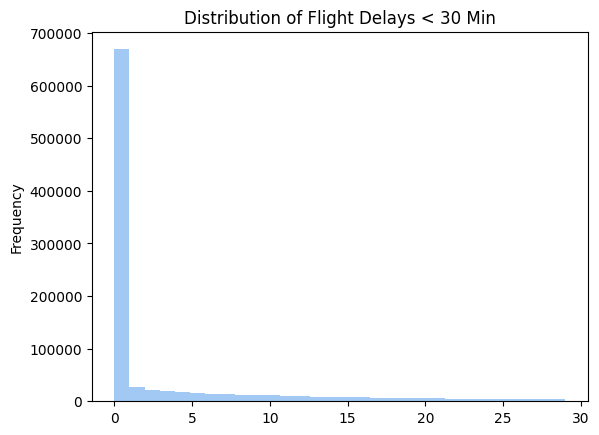

In [38]:
# Check number of delays
df.query("depdelayminutes < 30")["depdelayminutes"].plot(kind="hist", bins=30, title="Distribution of Flight Delays < 30 Min")
plt.show()

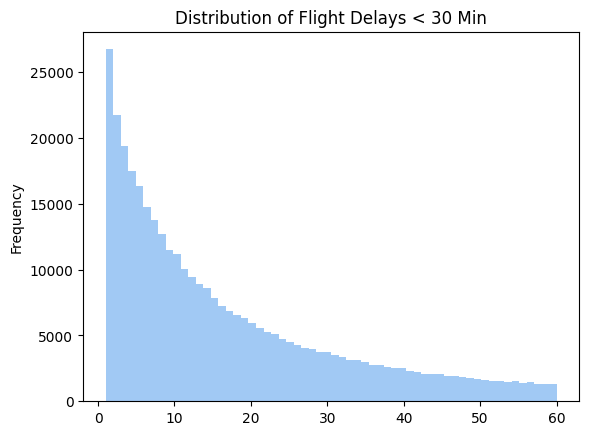

In [39]:
# Exclude 0 minutes of delay
df.query("depdelayminutes > 0 and depdelayminutes < 61")["depdelayminutes"].plot(kind="hist", bins=60, title="Distribution of Flight Delays < 30 Min")
plt.show()

In [40]:
# Adding a new columns to categorize the delay

# Initialize 
df["DelayType"] = None

# On Time 
df.loc[df["depdelayminutes"] == 0, "DelayType"] = "OnTime"

# Small delay 
df.loc[ (df["depdelayminutes"] > 0) & (df["depdelayminutes"] < 15), "DelayType" ] = "Small_Delay"

# Medium delay 
df.loc[ (df["depdelayminutes"] >= 15) & (df["depdelayminutes"] < 45), "DelayType" ] = "Medium_Delay"

# Large delay 
df.loc[df["depdelayminutes"] >= 45, "DelayType"] = "Large_Delay"

# Cancelled
df.loc[df["cancelled"], "DelayType"] = "Cancelled"


In [41]:
# Plot the delays using plotly

delay_counts = df["DelayType"].value_counts(ascending=True).to_frame("Count")
fig = px.bar(delay_counts, 
             x="Count", 
             orientation="h", 
             title="Flight Delays Histogram",
             width=800,
             height=400)

# Show the plot
fig.show()

In [42]:
# Plot the delays with percentage with respect to total number of flights 

delay_counts = df["DelayType"].value_counts(ascending=True).to_frame("Percentage")

fig = px.bar(delay_counts/df.shape[0]*100, 
             x="Percentage", 
             orientation="h", 
             title="Flight Delays Histogram",
             width=800,
             height=400)

# Add percentage labels on the bars
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Adjust layout to prevent labels going outside the image
fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),  # Adjust top margin to make room for title
    xaxis=dict(range=[0, 70]),  # Set x-axis range to ensure all bars are visible
)

# Show the plot
fig.show()


In [43]:
# Check difference between November and December (percentage)
df_month_delay = df.groupby("month")["DelayType"].value_counts(normalize=True).unstack() * 100
col_order = ["OnTime", "Small_Delay", "Medium_Delay", "Large_Delay", "Cancelled"]
df_month_delay[col_order].style.background_gradient(cmap="Blues").format("{:.2f}")

DelayType,OnTime,Small_Delay,Medium_Delay,Large_Delay,Cancelled
month,,,,,
11,65.25,18.16,9.87,6.10,0.63
12,56.49,18.70,12.63,9.77,2.42


#### Which is the most reliable airline? 

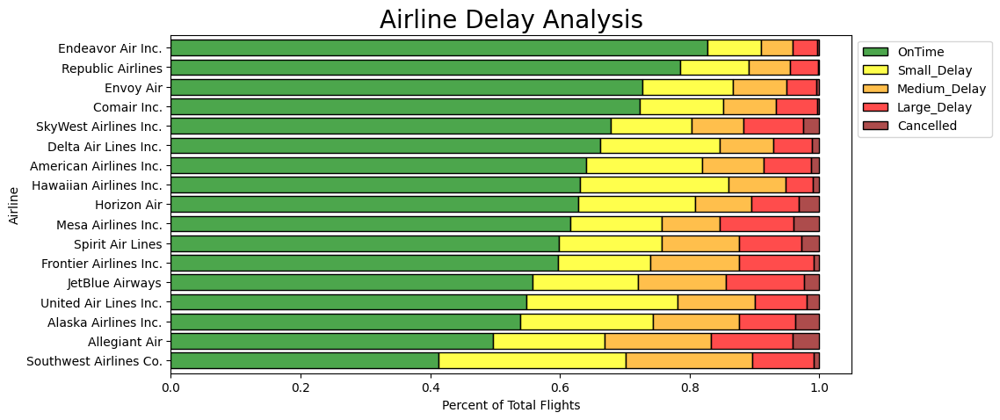

In [44]:
# Define base colors for each category
base_colors = ["green", "yellow", "orange", "red", "darkred"]

# Adjust transparency to create lighter shades
lighter_colors = [mcolors.to_rgba(color, alpha=0.7) for color in base_colors]

# Check percentage of delays for each airline
col_order = ["OnTime", "Small_Delay", "Medium_Delay", "Large_Delay", "Cancelled"]

df_airline_delay = (
    df.groupby(["Airline"])["DelayType"]
    .value_counts(normalize=True)
    .unstack()[col_order]
)

fig, ax = plt.subplots(figsize=(10, 5))
df_airline_delay.sort_values("OnTime").plot(
    kind="barh", stacked=True, ax=ax, width=0.8, edgecolor="black", color=lighter_colors
)
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title("Airline Delay Analysis", fontsize=20)
ax.set_xlabel("Percent of Total Flights")
plt.show()

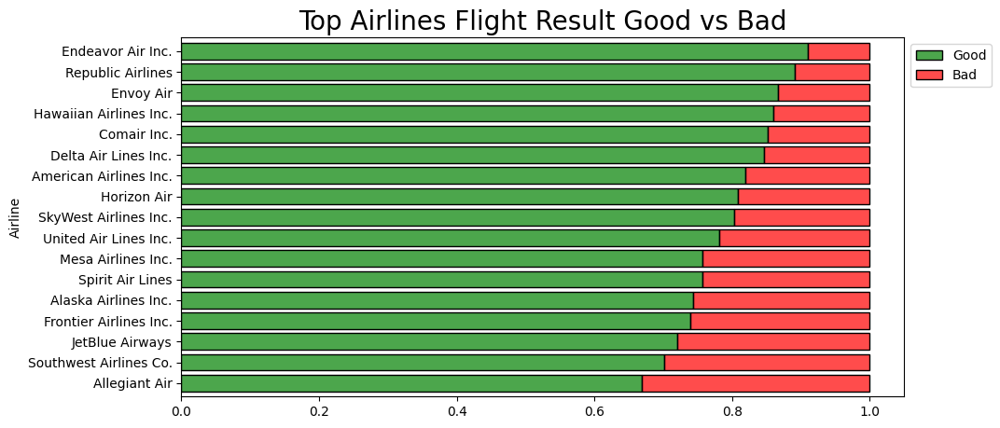

In [45]:
# Try to compact based to better visualization of the best airline 
delay_mapping = {
    "OnTime": "Good",
    "Small_Delay": "Good",
    "Medium_Delay": "Bad",
    "Large_Delay": "Bad",
    "Cancelled": "Bad",
}

df["DelayOk"] = df["DelayType"].map(delay_mapping)

df_agg = (
    df.groupby(["Airline"])["DelayOk"]
    .value_counts(normalize=True)
    .unstack()[["Good", "Bad"]]
)

# Define base colors for each category
base_colors = ["green", "red" ]

# Adjust transparency to create lighter shades
lighter_colors = [mcolors.to_rgba(color, alpha=0.7) for color in base_colors]

fig, ax = plt.subplots(figsize=(10, 5))
df_agg.sort_values("Good").plot(
    kind="barh", stacked=True, ax=ax, width=0.8, edgecolor="black", color=lighter_colors
)
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title("Top Airlines Flight Result Good vs Bad", fontsize=20)

plt.show()

### Motivation of Delays
Five possible categories:
- **Carrier delay** 
- **Weather delay** 
- **National Air System delay** =  Delays and cancellations attributable to the national aviation system that refer to a broad set of conditions, such as non-extreme weather conditions, airport operations, heavy traffic volume, and air traffic control.
- **Security delay** 
- **Late aircraft delay** = Late aircraft delay is a situation where a flight is delayed due to the late arrival of the aircraft assigned

The delay can be attributed to more than one reason.
The reason of delay is not always reported. <br>
The README doesn't specify if the delay reasons are related to the departure or the arrival. I will proceed with the hypothesis is associated with the departure.

In [46]:
# Motivation of delays 
delay_reasons = ["carrierdelay", "weatherdelay", "nasdelay", "securitydelay", "lateaircraftdelay"]
map_reason = {"carrierdelay": "Carrier delay", "weatherdelay": "Weather delay", "nasdelay": "NAS delay", "lateaircraftdelay": "Late aircraft delay"}

# Filter out rows with delayed flights (considering only medium and large as delays)
delayed_flights = df[df['depdel15'] == 1]

# Keep only the maximum delay for each row
delayed_flights[delay_reasons] = delayed_flights[delay_reasons].eq(delayed_flights[delay_reasons].max(axis=1), axis=0).mul(delayed_flights[delay_reasons])

# Drop rows where delay reason is not reported 
delayed_flights = delayed_flights.dropna(subset=delay_reasons, how='all')

# Add a new column with the name of the column in delay_reason with the maximum value
delayed_flights['max_delay_reason'] = delayed_flights[delay_reasons].idxmax(axis=1).map(map_reason)


reason_count = delayed_flights["max_delay_reason"].value_counts()
# Create a vertical bar plot using Plotly Express
fig = px.bar(
    reason_count,
    x=reason_count.index,
    y='max_delay_reason',
    title='Distribution of Delay Reasons',
    labels={'max_delay_reason': 'Number of delays', 'index': 'Delay Reason'},
    color_continuous_scale='Blues',
    height=600
)

# Add labels on top of each bar
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Customize layout
fig.update_layout(
    xaxis_title='Delay Reason',
    yaxis_title='Number of Delays',
    xaxis_tickangle=0,  # Rotate x-axis labels horizontally
)
# Show the plot
fig.show()







/tmp/ipykernel_285/3158858714.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
fig = px.pie(
    reason_count,
    names=reason_count.index,
    values='max_delay_reason',
    title='Distribution of Delay Reasons',
    labels={'max_delay_reason': 'Number of Delays', 'index': 'Delay Reason'},
    color_discrete_sequence=px.colors.qualitative.Set3,  # You can choose a different color sequence if needed
    height=600
)


# Adjust legend size in layout
fig.update_layout(
    legend=dict(
        title='',
        title_font=dict(size=35),  # Adjust the font size as needed
        font=dict(size=25),  # Adjust the font size as needed
        x=0.80,  # Adjust the x position (0 to 1)
        y=0.9,  # Adjust the y position (0 to 1)
    )
)

# Show the plot
fig.show()

##### Which is the best hour to avoid a delayed flight?

In [48]:
def convert2Time(var):
    """ Convert records to proper time format """
    try:
        if var != 0 or var != np.NAN:
            if str(int(var))[:-2].zfill(2) == '24':
                hh = '00'
            else:
                hh = str(int(var))[:-2].zfill(2)
            
            mm = str(int(var))[-2:].zfill(2)
            time = f"{hh}:{mm}"
        return time
    except Exception as e:
        pass

In [49]:
# Extract/Convert time
df['deptime'] = df['deptime'].apply(convert2Time)
df['crsdeptime'] = df['crsdeptime'].apply(convert2Time)
df['arrtime'] = df['arrtime'].apply(convert2Time)
df['crsarrtime'] = df['crsarrtime'].apply(convert2Time)

df[['deptime', 'crsdeptime', 'arrtime', 'crsarrtime']].head()

,deptime,crsdeptime,arrtime,crsarrtime
0,18:11,18:14,19:31,19:39
1,18:03,18:14,19:34,19:39
2,18:12,18:14,19:39,19:39
3,18:46,18:14,20:04,19:39
4,18:08,18:14,19:19,19:39


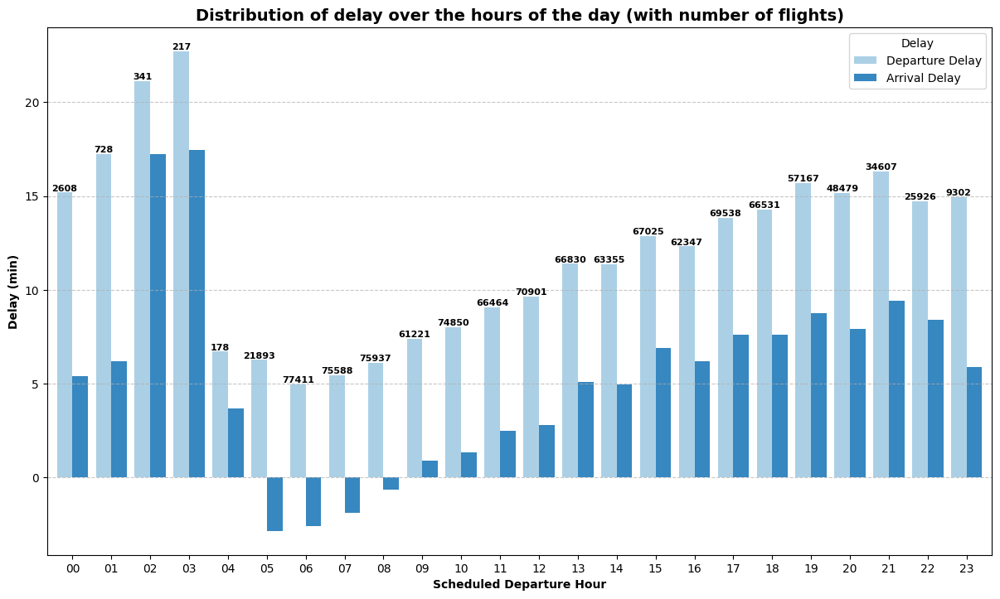

In [50]:
# Extract the hour
df['crsdephour'] = df['crsdeptime'].apply(lambda x: x[:2])

# Use a color palette
colors = sns.color_palette("Blues", 2)

# Plot
groups_hours = df.groupby('crsdephour')[['depdelay', 'arrdelay']]
ax = groups_hours.mean().plot.bar(figsize=[14.70, 8.27], color=colors, width=0.8)

# Add annotations for the number of elements in each group
for i, p in enumerate(ax.patches):
    if i < 24:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + 0.1,  # Adjust the vertical position of the text
            f'{groups_hours.size().iloc[i]}',
            ha="center",
            fontsize=8,
            weight="bold",
            color="black"
        )

# Title, labels & legend
plt.title("Distribution of delay over the hours of the day (with number of flights)", fontsize=14, weight="bold")
plt.ylabel('Delay (min)', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Hour', fontsize=10, weight="bold")
plt.legend(['Departure Delay', 'Arrival Delay'], title="Delay")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Customize x-axis ticks
plt.xticks(rotation=0)

plt.show()

##### Which is the best day to avoid a delayed flight?

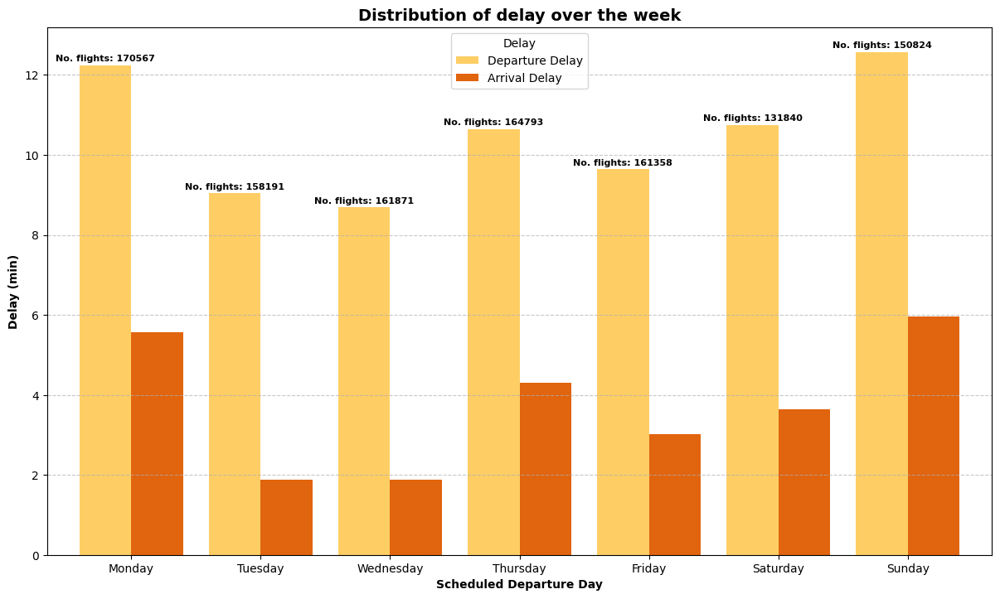

In [51]:
# Distribution over the days 

# Use a color palette
colors = sns.color_palette("YlOrBr", 2)

# Plot
groups_days = df.groupby('dayofweek')[['depdelay', 'arrdelay']]
ax = groups_days.mean().plot.bar(figsize=[14.70, 8.27], color=colors, width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add annotations for the number of elements in each group
for i, p in enumerate(ax.patches):
    if i < 7:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + 0.01 * height,  # Adjust the vertical position dynamically
            f'No. flights: {groups_days.size().iloc[i]}',
            ha="center",
            fontsize=8,
            weight="bold",
            color="black"
        )

# Title, labels & legend
plt.title("Distribution of delay over the week", fontsize=14, weight="bold")
plt.ylabel('Delay (min)', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Day', fontsize=10, weight="bold")
plt.legend(['Departure Delay', 'Arrival Delay'], title="Delay")

# Customize x-axis ticks
day_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.xticks(range(7), day_labels, rotation=0)

plt.show()

#### Which is the airport with the highest time of delays?

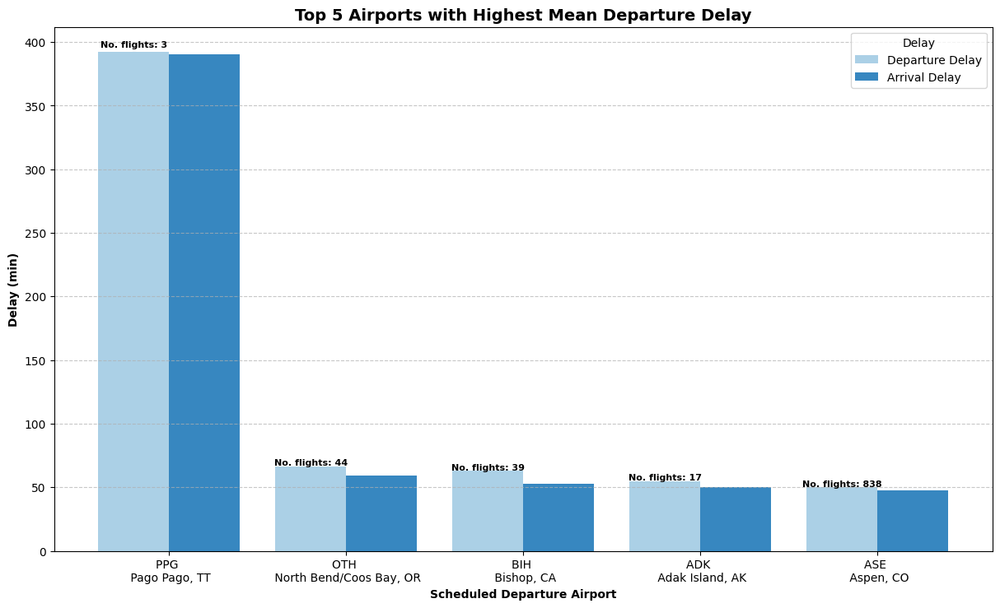

In [53]:


# Associate each airport to the city 
airport_to_city = dict(zip(df['origin'], df['origincityname']))

# Calculate mean delay for each origin airport
airport_delay = df.groupby('origin')[['depdelay', 'arrdelay']].mean()

# Select the top 5 airports with the highest departure delay
top_airports = airport_delay.nlargest(5, 'depdelay')

# Combine airport code and city name for x-axis labels
top_airports['airport_with_city'] = top_airports.index.map(lambda x: "{} \n {}".format(x,airport_to_city.get(x)) )

# Use a color palette
colors = sns.color_palette("Blues", 2)

# Plot 
ax = top_airports.plot.bar(figsize=[14.70, 8.27], color=colors, width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add annotations for the number of elements in each group
for i, p in enumerate(ax.patches):
    if i < 5:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + 0.01 * height,  # Adjust the vertical position dynamically
            f'No. flights: {df[df["origin"]==top_airports.index[i]].shape[0]}',
            ha="center",
            fontsize=8,
            weight="bold",
            color="black"
        )

# Title, labels & legend
plt.title("Top 5 Airports with Highest Mean Departure Delay", fontsize=14, weight="bold")
plt.ylabel('Delay (min)', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Airport', fontsize=10, weight="bold")

# Rotate x-axis labels to be horizontal
plt.xticks(rotation=0)
plt.xticks(range(len(top_airports)), top_airports['airport_with_city'])

plt.legend(['Departure Delay', 'Arrival Delay'], title="Delay")

plt.show()


##### Why so much delay in Pago Pago? 

The airport with ID PPG has only three flights. The airline is HA. Motivation of delay is carrier delay for all. <br>
There should have been some problem with that carrier in these days.

In [54]:

delayed_flights_ppg = delayed_flights[delayed_flights["origin"] == "PPG"]
delayed_flights_ppg

,year,quarter,month,dayofmonth,dayofweek,flightdate,reporting_airline,dot_id_reporting_airline,iata_code_reporting_airline,tail_number,flight_number_reporting_airline,originairportid,originairportseqid,origincitymarketid,origin,origincityname,originstate,originstatefips,originstatename,originwac,destairportid,destairportseqid,destcitymarketid,dest,destcityname,deststate,deststatefips,deststatename,destwac,crsdeptime,deptime,depdelay,depdelayminutes,depdel15,departuredelaygroups,deptimeblk,taxiout,wheelsoff,wheelson,taxiin,crsarrtime,arrtime,arrdelay,arrdelayminutes,arrdel15,arrivaldelaygroups,arrtimeblk,cancelled,cancellationcode,diverted,crselapsedtime,actualelapsedtime,airtime,flights,distance,distancegroup,carrierdelay,weatherdelay,nasdelay,securitydelay,lateaircraftdelay,firstdeptime,totaladdgtime,longestaddgtime,divairportlandings,divreacheddest,divactualelapsedtime,divarrdelay,divdistance,div1airport,div1airportid,div1airportseqid,div1wheelson,div1totalgtime,div1longestgtime,div1wheelsoff,div1tailnum,div2airport,div2airportid,div2airportseqid,div2wheelson,div2totalgtime,div2longestgtime,div2wheelsoff,div2tailnum,div3airport,div3airportid,div3airportseqid,div3wheelson,div3totalgtime,div3longestgtime,div3wheelsoff,div3tailnum,div4airport,div4airportid,div4airportseqid,div4wheelson,div4totalgtime,div4longestgtime,div4wheelsoff,div4tailnum,div5airport,div5airportid,div5airportseqid,div5wheelson,div5totalgtime,div5longestgtime,div5wheelsoff,div5tailnum,empty_col,Airline,DelayType,DelayOk,max_delay_reason
226130,2021,4,12,6,1,2021-12-06,HA,19690,HA,N374HA,466,14222,1422207,34222,PPG,"Pago Pago, TT",TT,75,U.S. Pacific Trust Territories and Possessions,5,12173,1217305,32134,HNL,"Honolulu, HI",HI,15,Hawaii,2,2130,2251.0,81.0,81.0,1.0,5.0,2100-2159,14.0,2305.0,503.0,11.0,400,514.0,74.0,74.0,1.0,4.0,0001-0559,False,NaN,0.0,330.0,323.0,298.0,1.0,2599.0,11,74.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hawaiian Airlines Inc.,Large_Delay,Bad,Carrier delay
834447,2021,4,11,1,1,2021-11-01,HA,19690,HA,N378HA,466,14222,1422207,34222,PPG,"Pago Pago, TT",TT,75,U.S. Pacific Trust Territories and Possessions,5,12173,1217305,32134,HNL,"Honolulu, HI",HI,15,Hawaii,2,2315,14.0,59.0,59.0,1.0,3.0,2300-2359,14.0,28.0,632.0,6.0,545,638.0,53.0,53.0,1.0,3.0,0001-0559,False,NaN,0.0,330.0,324.0,304.0,1.0,2599.0,11,52.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hawaiian Airlines Inc.,Large_Delay,Bad,Carrier delay
834448,2021,4,11,18,4,2021-11-18,HA,19690,HA,N385HA,466,14222,1422207,34222,PPG,"Pago Pago, TT",TT,75,U.S. Pacific Trust Territories and Possessions,5,12173,1217305,32134,HNL,"Honolulu, HI",HI,15,Hawaii,2,2130,1447.0,1037.0,1037.0,1.0,12.0,2100-2159,16.0,1503.0,2115.0,9.0,400,2124.0,1044.0,1044.0,1.0,12.0,0001-0559,False,NaN,0.0,330.0,337.0,312.0,1.0,2599.0,11,1044.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hawaiian Airlines Inc.,Large_Delay,Bad,Carrier delay


#### Which is the airport with least time of delays?

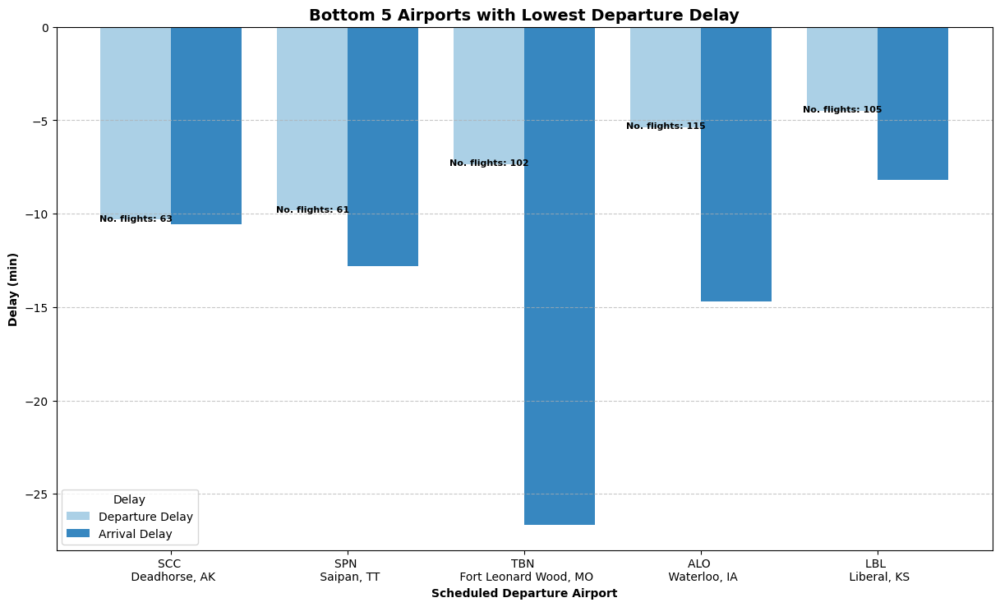

In [55]:
# Associate each airport to the city 
airport_to_city = dict(zip(df['origin'], df['origincityname']))

# Calculate mean delay for each origin airport
airport_delay = df.groupby('origin')[['depdelay', 'arrdelay']].mean()

# Select the least 5 airports with the lowest departure delay
bottom_airports = airport_delay.nsmallest(5, 'depdelay')

# Combine airport code and city name for x-axis labels
bottom_airports['airport_with_city'] = bottom_airports.index.map(lambda x: "{} \n {}".format(x, airport_to_city.get(x)))

# Use a color palette
colors = sns.color_palette("Blues", 2)

# Plot
ax = bottom_airports.plot.bar(figsize=[14.70, 8.27], color=colors, width=0.8)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add annotations for the number of elements in each group
for i, p in enumerate(ax.patches):
    if i < 5:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width() / 2.,
            height + 0.01 * height,  # Adjust the vertical position dynamically
            f'No. flights: {df[df["origin"]==bottom_airports.index[i]].shape[0]}',
            ha="center",
            fontsize=8,
            weight="bold",
            color="black"
        )

# Title, labels & legend
plt.title("Bottom 5 Airports with Lowest Departure Delay", fontsize=14, weight="bold")
plt.ylabel('Delay (min)', fontsize=10, weight="bold")
plt.xlabel('Scheduled Departure Airport', fontsize=10, weight="bold")

# Rotate x-axis labels to be horizontal
plt.xticks(rotation=0)
plt.xticks(range(len(bottom_airports)), bottom_airports['airport_with_city'])

plt.legend(['Departure Delay', 'Arrival Delay'], title="Delay")

plt.show()


### Diverted Analysis

In [56]:
# Only a really small amount of flights are diverted, we will skip this analysis 
print("Percentage of diverted flights: {:.2f}%".format(df["diverted"].mean()*100))

Percentage of diverted flights: 0.19%


# Further Analysis


#### Which is the airline covering the highest mean distance and the highest overall distance?

In [57]:
# Calculate mean distance covered for each airline
distance_covered = df.groupby('Airline')[['distance']].mean().reset_index()

# Sort the DataFrame by mean distance covered in descending order
distance_covered = distance_covered.sort_values(by='distance', ascending=True)

# Format the 'distance' column to two decimal places
distance_covered['distance'] = distance_covered['distance'].round(2)

# Plot horizontal bar chart using Plotly
fig = px.bar(distance_covered, x='distance', y='Airline', orientation='h', text='distance',
             labels={'distance': 'Mean Distance Covered (Miles)', 'Airline': 'Airline'},
             title='Mean Distance Covered by Each Airline',
             height=600, width=800)

# Show the figure
fig.show()

In [58]:
# Calculate overall distance covered for each airline
total_distance = df.groupby('Airline')[['distance']].sum().reset_index()

# Sort the DataFrame by total distance covered in descending order
total_distance = total_distance.sort_values(by='distance', ascending=True)

# Format the 'distance' column to two decimal places
total_distance['distance'] = total_distance['distance'].round(2)

# Plot horizontal bar chart using Plotly
fig = px.bar(total_distance, x='distance', y='Airline', orientation='h', text='distance',
             labels={'distance': 'Total Distance Covered (Miles)', 'Airline': 'Airline'},
             title='Total Distance Covered by Each Airline',
             height=600, width=800)

# Show the figure
fig.show()

#### What's the busiest airport?

In [59]:
# Concatenate 'origin' and 'dest' to get all airports
all_airports = pd.concat([df['origin'], df['dest']])

# Calculate the count of each airport
airport_counts = all_airports.value_counts()

# Select the top 5 busiest airports
top_airports = airport_counts.head(10)


top_airports_df = top_airports.reset_index().rename(columns={'index': 'Airport', 0: 'Count'}).sort_values(by="Count", ascending=True)

# Map airport codes to city names
top_airports_df['City'] = top_airports_df['Airport'].map(airport_to_city)

# Plot horizontal histogram using Plotly Express
fig = px.bar(top_airports_df, x='Count', y='Airport', orientation='h',
             labels={'Count': 'Number of Flights', 'Airport': 'Airport'},
             title='Top 10 Busiest Airports',
             height=600, width=800)

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Percentage of Delayed Flights'),
    yaxis=dict(title='Airport'),
    showlegend=False  # remove legend
)

# Update y-axis labels to include city names
fig.update_yaxes(tickmode='array', tickvals=list(range(10)), ticktext=top_airports_df[['Airport', 'City']].apply(lambda x: f"{x[0]} - {x[1]}", axis=1))

# Show the figure
fig.show()


##### Busier --> More delays? 

In [60]:
# Calculate the total number of flights and delayed flights for each origin
airport_stats = df.groupby('origin')['depdel15'].agg(['count', 'sum'])

# Sort airports by the number of delayed flights in descending order
top_airports = airport_stats.sort_values(by='sum', ascending=False).head(5).sort_values(by='sum', ascending=True)

# Map airport codes to city names
top_airports['Airport_with_City'] = top_airports.apply(lambda row: f"{row.name} - {airport_to_city.get(row.name, '')} ({int(row['count'])} flights)",
                                                        axis=1)

# Create horizontal histogram with Plotly Express
fig = px.bar(top_airports, x='sum', y="Airport_with_City",
             labels={'sum': 'Number of Delayed Flights', 'index': 'Airport'},
             orientation='h',
             title='Top 5 Airports with Highest Number of Delayed Flights',
             color_discrete_sequence=['skyblue'])

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Number of Delayed Flights'),
    yaxis=dict(title='Airport'),
    showlegend=False  # remove legend
)

# Show the plot
fig.show()


##### Highest percentage of delays?

In [61]:
# Calculate the total number of flights and delayed flights for each origin
airport_stats = df.groupby('origin')['depdel15'].agg(['count', 'sum'])

# Calculate the percentage of delayed flights for each origin
airport_stats['percentage_delayed'] = (airport_stats['sum'] / airport_stats['count']) * 100

# Sort airports by percentage of delays in descending order
top_airports = airport_stats.sort_values(by='percentage_delayed', ascending=False).head(10).sort_values(by='percentage_delayed', ascending=True)

# Map airport codes to city names
top_airports['Airport_with_City'] = top_airports.apply(lambda row: f"{row.name} - {airport_to_city.get(row.name, '')} ({int(row['count'])} flights)",
                                                        axis=1)

# Create horizontal histogram with Plotly Express
fig = px.bar(top_airports, x='percentage_delayed', y='Airport_with_City',
             labels={'percentage_delayed': 'Percentage of Delayed Flights', 'Airport_with_City': 'Airport'},
             orientation='h',
             title='Top 10 Airports with Highest Percentage of Delayed Flights',
             color_discrete_sequence=['skyblue'])

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Percentage of Delayed Flights'),
    yaxis=dict(title='Airport'),
    showlegend=False  # remove legend
)

# Show the plot
fig.show()

In [62]:
# Same analysis, but filtering only to have airports with more than 10k flights 
airport_stats = df.groupby('origin')['depdel15'].agg(['count', 'sum'])
airport_stats = airport_stats[airport_stats['count'] > 10000]

# Calculate the percentage of delayed flights for each origin
airport_stats['percentage_delayed'] = (airport_stats['sum'] / airport_stats['count']) * 100

# Sort airports by percentage of delays in descending order
top_airports = airport_stats.sort_values(by='percentage_delayed', ascending=False).head(10).sort_values(by='percentage_delayed', ascending=True)

# Map airport codes to city names
top_airports['Airport_with_City'] = top_airports.apply(lambda row: f"{row.name} - {airport_to_city.get(row.name, '')} ({int(row['count'])} flights)",
                                                        axis=1)

# Create horizontal histogram with Plotly Express
fig = px.bar(top_airports, x='percentage_delayed', y='Airport_with_City',
             labels={'percentage_delayed': 'Percentage of Delayed Flights', 'Airport_with_City': 'Airport'},
             orientation='h',
             title='Top 10 Airports with Highest Percentage of Delayed Flights (only >10k flights)',
             color_discrete_sequence=['skyblue'])

# Set layout parameters
fig.update_layout(
    bargap=0.05,  # gap between bars
    xaxis=dict(title='Percentage of Delayed Flights'),
    yaxis=dict(title='Airport'),
    showlegend=False  # remove legend
)

# Show the plot
fig.show()